In [1]:
import networkx as nx
import pandas as pd
import geopandas as gpd
import numpy as np
import contextily as cx

import matplotlib.pyplot as plt

# A Network of African Cities
(Freely available.)

In [2]:
# read in the data
edges = pd.read_csv("https://raw.githubusercontent.com/rafaelprietocuriel/AfricanUrbanNetwork/main/AfricaNetworkEdges.csv")
nodes = pd.read_csv("https://raw.githubusercontent.com/rafaelprietocuriel/AfricanUrbanNetwork/main/AfricaNetworkNodes.csv", encoding='unicode_escape', engine ='python')

This dataset is a set of nodes representing African cities and a set of edges representing the route between them. Although each link is simplified to a straight line from city to city, it has a length attribute that aggregates the lengths of the roads that make up the edge—in effect capturing the circuity of the path numerically even if the edge is simplified geometrically. Let's see how it looks.

Text(0.5, 0.98, 'African Urban Network')

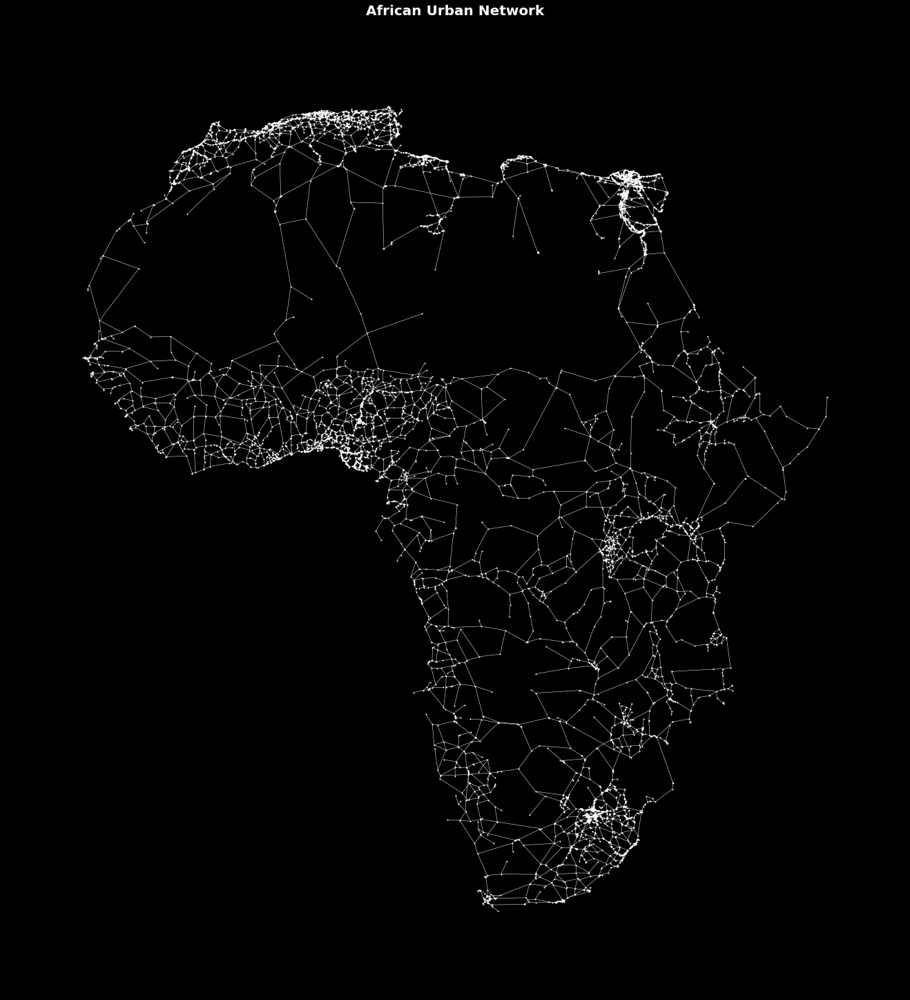

In [3]:
# make the network
G = nx.from_pandas_edgelist(edges, source='from', target='to', edge_attr = ['l', 'time', 'timeU', 'timeUCB'])

# add the node attributes
nx.set_node_attributes(G, nodes.set_index('Agglomeration_ID').to_dict('index'))

# plot the network
fig, ax = plt.subplots(1, 1, figsize=(20, 20), 
                       facecolor='k',
                       constrained_layout=True, 
                       subplot_kw=dict(aspect='equal'))

position = dict(zip(list(G.nodes()), [[v['x'], v['y']] for k, v in G.nodes(data=True)]))

nx.draw_networkx_edges(G, ax=ax, pos=position, edge_color='w', width=0.5)
nx.draw_networkx_nodes(G, ax=ax, pos=position, node_color='w', node_size=1)

ax.set_facecolor('k')

fig.suptitle('African Urban Network', color='w', size=20, weight='bold')

Another idiosyncracy is that locations where major roads join but there are no cities are kept in the network is nodes of population 0. We do not want these to be included in any kind of gravity calculation because people do not actually travel _to_ them, just _through_ them. Here is a way around this.

(Note: the use of `nx.all_pairs_dijkstra_path_length` which is a fast way to get all combinations of shortest paths.)

In [4]:
# compute the weighted distance between nodes using dijkstra's algorithm
# 3500 kilometers is the distance from Lagos to Dakar, the ends of a corridor according to the literature
%time distances = dict(nx.all_pairs_dijkstra_path_length(G, weight='l', cutoff=3500))

CPU times: user 23.1 s, sys: 424 ms, total: 23.6 s
Wall time: 23.6 s


In [5]:
# the data also have travel time estimates under different scenarios (with and without border controls)
# travel time is in minutes so we can reasonably say that no one should drive more than a day to get to another city
%time time_delayed = dict(nx.all_pairs_dijkstra_path_length(G, weight='timeUCB', cutoff=24 * 60))
%time time_reduced = dict(nx.all_pairs_dijkstra_path_length(G, weight='timeU', cutoff=24 * 60))

CPU times: user 4.84 s, sys: 81.3 ms, total: 4.92 s
Wall time: 4.92 s
CPU times: user 7.62 s, sys: 129 ms, total: 7.74 s
Wall time: 7.75 s


In [6]:
# get the index values for roads, which are labeled as 'road' in the 'agglosName' attribute with the node data
junctions = [n for n, d in G.nodes(data=True) if d['agglosName']=='road']

In [7]:
# how many nodes to we start out with?
len(G.nodes())

7361

In [8]:
# remove entries in the dictionary that are junctions, del for delete
for k in junctions:
    del distances[k]
    del time_delayed[k]
    del time_reduced[k]

In [9]:
# check to see that we are down to just the cities
len(distances)

2162

In [10]:
# for each entry in distances, remove the self-loops
for i in distances:
    del distances[i][i]
    del time_delayed[i][i]
    del time_reduced[i][i]

In [11]:
# convert distances to data frame then melt all columns into a single column
pathlengths = pd.DataFrame(distances).reset_index().melt(id_vars='index', var_name='to', value_name='distance')
pathlengths = pathlengths.reset_index(drop=True).rename(columns={'index':'from'})
pathlengths = pathlengths[pathlengths['from']!=pathlengths['to']].reset_index(drop=True)
pathlengths.head()

,from,to,distance
0,5425,8211,0.798800
1,1000559,8211,1.113085
2,1000567,8211,1.314500
3,2333,8211,4.294382
4,1027090,8211,4.532485


In [12]:
nodes = nodes.set_index('Agglomeration_ID')
nodes.head()

,agglosName,x,y,Pop2015,ISO3,Region,Between,degree
Agglomeration_ID,,,,,,,,
2320,Cairo,31.324,30.130,22995802,EGY,North,6.979617e+07,6
5199,Lagos,3.316,6.668,11847635,NGA,West,3.127663e+07,4
7098,Onitsha,6.928,5.815,8530514,NGA,West,2.110388e+07,6
4220,Johannesburg,28.016,-26.050,8314220,ZAF,South,3.568974e+07,5
4858,Kinshasa,15.293,-4.408,7270000,COD,Central,1.119784e+06,4


We need to set up the gravity model. According to the literature that I have seen, for migration, the coefficients on population are usually between 0.5 and 1.5 (so we can just call it one to make the calculation easy) and the distance decay is about 1 for internal migration and 1.6 for external migration. We will use this larger value as a guesstimate for how people move between African cities.

In [13]:
# compute a gravity model with population and distance
def gravity(distances, nodes, alpha=1, beta=1):
    # compute the denominator
    denominator = 0
    for i in distances:
        for j in distances[i]:
            denominator += (np.power(distances[i][j], -float(beta)) * nodes.loc[i, 'Pop2015'] * nodes.loc[j, 'Pop2015'])
    
    # compute the gravity model
    gravity = {}
    for i in distances:
        gravity[i] = {}
        for j in distances[i]:
            gravity[i][j] = (np.power(distances[i][j], -float(beta)) * nodes.loc[i, 'Pop2015'] * nodes.loc[j, 'Pop2015']) / denominator
    
    return gravity

# wrap it into a data frame
def flow_dataframe(flows):
    df = pd.DataFrame(flows).reset_index().melt(id_vars='index', var_name='to', value_name='flow')
    df = df.reset_index(drop=True).rename(columns={'index':'from'})
    df = df[df['from']!=df['to']].reset_index(drop=True)
    return df

In [14]:
%time flows = flow_dataframe(gravity(distances, nodes, beta=1.6))

CPU times: user 1min 32s, sys: 881 ms, total: 1min 33s
Wall time: 1min 33s


In [15]:
%time flows_delayed = flow_dataframe(gravity(time_delayed, nodes, beta=1.6))
%time flows_reduced = flow_dataframe(gravity(time_reduced, nodes, beta=1.6))

CPU times: user 20 s, sys: 280 ms, total: 20.3 s
Wall time: 20.3 s
CPU times: user 27.9 s, sys: 408 ms, total: 28.3 s
Wall time: 28.3 s


In [16]:
# these flows sum to 1 and should represent the proportion of total flows in Africa
flows['flow'].sum()

0.9999999999999541

In [17]:
# join all three flows with different column names
flows = flows.merge(flows_delayed, on=['from', 'to'], suffixes=['', '_delayed'])
flows = flows.merge(flows_reduced, on=['from', 'to'], suffixes=['', '_reduced'])
flows.head()

,from,to,flow,flow_delayed,flow_reduced
0,5425,8211,0.000013,0.000052,0.000045
1,1000559,8211,0.000000,0.000000,0.000000
2,1000567,8211,0.000000,0.000000,0.000000
3,2333,8211,0.000088,0.000650,0.000560
4,1027090,8211,0.000000,0.000000,0.000000


We have flows between cities now. What if we wanted to then impute the roads so that we could assess the importance of various routes on the network? When we deleted then junctions, we create an topoligcally reduced abstract representation of routes, which we will need to reverse to put the flows back onto the original network. 

In [18]:
# filter flows out flows that are less than 0 
flows_trimmed = flows[flows['flow']>0].reset_index(drop=True)

# compare the size of the data frames
print(len(flows_trimmed))
print(len(flows_delayed))

1495860
15875566


In [19]:
# colorcet is a great library for color palettes
import colorcet as cc

In [25]:
# plot the network in datashader with a log scale
import datashader as ds
import datashader.transfer_functions as tf

from datashader.bundling import connect_edges, hammer_bundle
from datashader.colors import inferno, viridis
from datashader.utils import export_image
from datashader.utils import lnglat_to_meters

def get_graph(edges, nodes, method='direct'):
    if method == 'bundled':
        print('Bundling desire lines...')
        return hammer_bundle(nodes, edges,
                             source='from', target='to',
                             decay=0.25, initial_bandwidth=0.1,
                             weight='flow',
                             x='x', y='y')
    else:
        print('Linking desire lines...')
        return connect_edges(nodes, edges,
                             source='from', target='to',
                             weight='flow',
                             x='x', y='y')

def composers(graph, nodes):
    canvas = ds.Canvas(x_range=(nodes['x'].min(), nodes['x'].max()),
                       y_range=(nodes['y'].min(), nodes['y'].max()),
                       plot_height=3000, plot_width=3000)


    agg = tf.shade(canvas.line(graph, 'x', 'y', agg=ds.count('flow')),  cmap=cc.fire, how='eq_hist')
    img = tf.set_background(agg, "#000000")
    
    return img



Linking desire lines...


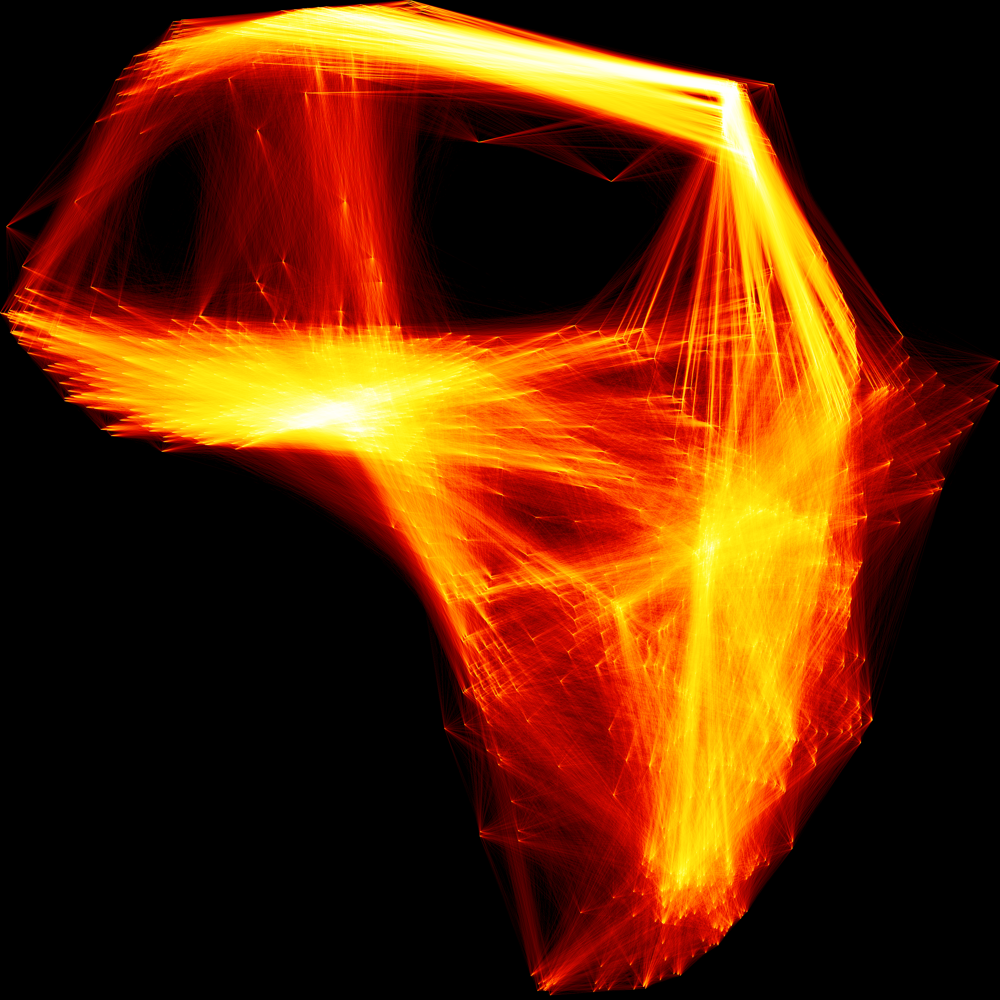

In [26]:
img = composers(get_graph(flows_trimmed, nodes[['x', 'y']], method='direct'), nodes)
export_image(img, 'africa_network', background='black')

In [ ]:
# get shortest paths
paths = dict(nx.all_pairs_dijkstra_path(G, weight='l', cutoff=3500))

In [ ]:
# keep only the shortest paths that are in the from, to pairs
paths_trimmed = {}
for i in paths:
    paths_trimmed[i] = {}
    for j in paths[i]:
        if (i, j) in flows_trimmed[['from', 'to']].values:
            paths_trimmed[i][j] = paths[i][j]